<div class="usecase-title">Assessing Parking Availability Around Cafe, Restaurant, Bistro seats, Bar, Tavern and Pubs</div>

<div class="usecase-authors"><b>Authored by: </b> Chathu Siriwardena</div>

<div class="usecase-duration"><b>Duration:</b> {90} mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>{Intermediate}</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b> Python, Data Wrangling, Data Visualization, Data Modeling, Machine Learning, Deep Learning, Geographical Coordinates Handling</div>
</div>

<div class="usecase-section-header">Scenario</div>
<br>This use case aims to evaluate the sufficiency of on-street parking around Cafe, restaurant, bistro seats, Bar, tavern, pub in Melbourne. By analyzing the locations of car parking meters, parking bays, and business establishments, the City of Melbourne can ensure adequate parking facilities to support local businesses and enhance visitor convenience. 


User Story

As a cafe owner, I want to know the availability of nearby parking spaces so that I can ensure my customers have convenient parking option.

As a restaurant manager, I want to know about the availability of nearby parking so that I can enhance the dining experience for my guests.

As a customer, I want to identify available parking spots so that I can easily visit the bistro without the frustration of a lengthy parking search.

As a council planner, I want to know the availability of nearby parking spaces around cafés so that we can ensure adequate parking infrastructure for the convenience of residents and visitors.

At the end of this use case you will:<br>
-Learn to import data sets using API v2.1 <br>
-Learn data manipulations and merging datasets<br>
-Learn data visualisation using  matplotlib, seaborn<br>
-Learn  to work with categorical locations and geolocations using geopy<br>
-Learn to plot Maps using folium <br>



Data Sets Used:

-
Data Set 1 [Cafes and Restaurants with Seating Capacity](https://data.melbourne.vic.gov.au/explore/dataset/cafes-and-restaurants-with-seating-capacity/information/).<br> This data set contains Block ID, Property ID, Base property ID, Building address, CLUE small area, Trading name, Business address, Industry code, Industry description, Seating type, Number of seats, Longitude, Latitude and Location. The data set was used to identify the locations of the cafes and restaurants with their seating capacities. The dataset is imported from Melbourne Open Data website, using API V2





-
Data Set 2 [Bars and Pubs with Patron Capacity](https://data.melbourne.vic.gov.au/explore/dataset/bars-and-pubs-with-patron-capacity/information/).<br> This data set contains Block ID, Property ID, Base property ID, Building address, CLUE small area, Trading name, Business address, Number of patrons, Longitude, Latitude and Location. The data set was used to identify the locations of the Bars, tavern and pubs with their patron capacities. The dataset is imported from Melbourne Open Data website, using API V2





-
Data Set 3 [On Street Parking Bays](https://data.melbourne.vic.gov.au/explore/dataset/on-street-parking-bays/information/).<br> This data set contains Roadsegment id, Kerbside id, Roadsegment Description, Latitude, Longitude and Last updated . The data set was used to identify the locations of the parking bays within the city of Melbourn. The dataset is imported from Melbourne Open Data website, using API V2





-
Data Set 4 [On Street Car Parking Meters with Location](https://data.melbourne.vic.gov.au/explore/dataset/on-street-car-parking-meters-with-location/information/).<br> This data set contains Barcode, Credit card, Tap and go, Longitude, Latitude, Location,  Asset id, Meter id and Location Description. The data set was used to identify the locations of the parking meters within the City of Melbourne. The dataset is imported from Melbourne Open Data website, using API V2





##### Importing Required Libraries



In [3]:
import requests
import pandas as pd
import numpy as np
from io import StringIO
import geopy
from geopy.geocoders import Nominatim
import folium
from ipywidgets import interact, widgets
from IPython.display import display
import seaborn as sns
import matplotlib.pyplot as plt
import re as re
from geopy.extra.rate_limiter import RateLimiter

##### Loading all Data sets



<div class="Data_Set">Data Set 1: Cafes and Restaurants with Seating Capacity.</div>


In [43]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='cafes-and-restaurants-with-seating-capacity'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    cafes_df=pd.read_csv(StringIO(url_content),delimiter=';')
    print(cafes_df.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

   census_year  block_id  property_id  base_property_id  \
0         2017         6       578324            573333   
1         2017         6       578324            573333   
2         2017        11       103957            103957   
3         2017        11       103957            103957   
4         2017        11       103985            103985   
5         2017        11       103987            103987   
6         2017        11       103993            103993   
7         2017        11       108971            108971   
8         2017        11       559405            559405   
9         2017        12       103955            103955   

                         building_address  clue_small_area  \
0        2 Swanston Street MELBOURNE 3000  Melbourne (CBD)   
1        2 Swanston Street MELBOURNE 3000  Melbourne (CBD)   
2    517-537 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
3    517-537 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
4  562-564 Flinders Street MELBOURNE 300

<div class="Data_Set">Data Set 2: Bars and Pubs with Patron Capacity.</div>


In [44]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='bars-and-pubs-with-patron-capacity'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    bars_df=pd.read_csv(StringIO(url_content),delimiter=';')
    print(bars_df.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

   census_year  block_id  property_id  base_property_id  \
0         2002        11       108972            108972   
1         2002        14       103172            103172   
2         2002        15       103944            103944   
3         2002        16       103938            103938   
4         2002        17       103925            103925   
5         2002        33       105937            105937   
6         2002        35       102143            102143   
7         2002        37       102158            102158   
8         2002        42       105392            105392   
9         2002        43       108069            108069   

                               building_address  clue_small_area  \
0           10-22 Spencer Street MELBOURNE 3000  Melbourne (CBD)   
1         31-39 Elizabeth Street MELBOURNE 3000  Melbourne (CBD)   
2          277-279 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
3              187 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
4         

<div class="usecase-section-header">Data Set 3: On Street Parking Bays</div>


In [11]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='on-street-parking-bays'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    parkingbays_df=pd.read_csv(StringIO(url_content),delimiter=';')
    print(parkingbays_df.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

   roadsegmentid kerbsideid  \
0          22730        NaN   
1          22730        NaN   
2          20013       5701   
3          20013      23444   
4          22268        NaN   
5          22295        NaN   
6          22295        NaN   
7          22295        NaN   
8          21108        NaN   
9          20950        NaN   

                              roadsegmentdescription   latitude   longitude  \
0  Park Street between Mason Street and Randall P... -37.836245  144.982021   
1  Park Street between Mason Street and Randall P... -37.835800  144.982115   
2  Lonsdale Street between William Street and Kin... -37.814238  144.955451   
3  Lonsdale Street between William Street and Kin... -37.814271  144.955334   
4  Clowes Street between Anderson Street and Wals... -37.830568  144.984713   
5  Anderson Street between Domain Road and Acland... -37.833607  144.983763   
6  Anderson Street between Domain Road and Acland... -37.833657  144.983753   
7  Anderson Street between

<div class="usecase-section-header">Data Set 4: On Street Car Parking Meters with Location
.</div>


In [12]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='on-street-car-parking-meters-with-location'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    parkingmeters_df=pd.read_csv(StringIO(url_content),delimiter=';')
    print(parkingmeters_df.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

      barcode creditcard tapandgo   longitude   latitude  \
0  MPM1629535        Yes      Yes  144.950892 -37.781481   
1  MPM1629544        Yes      Yes  144.954400 -37.783399   
2  MPM1629545        Yes      Yes  144.951384 -37.787068   
3  MPM1629560        Yes      Yes  144.954217 -37.784939   
4  MPM1629563        Yes      Yes  144.953962 -37.783012   
5  MPM1629564        Yes      Yes  144.955202 -37.784034   
6  MPM1629565        Yes      Yes  144.952152 -37.786401   
7  MPM1629566        Yes      Yes  144.952518 -37.786327   
8  MPM1629568        Yes      Yes  144.954836 -37.784449   
9  MPM1629569        Yes      Yes  144.950414 -37.781704   

                   location  asset_id meter_id  \
0  -37.7814806, 144.9508916   1629535    ZOOT4   
1  -37.7833993, 144.9543996   1629544   ZOOT10   
2  -37.7870681, 144.9513842   1629545  ZOOT22A   
3  -37.7849386, 144.9542174   1629560   ZOOT17   
4  -37.7830122, 144.9539618   1629563    ZOOT7   
5  -37.7840342, 144.9552017   1629564  

#### Cafes and restaurants with seating capacity.



In [6]:
cafes_df.head()

,census_year,block_id,property_id,base_property_id,building_address,clue_small_area,trading_name,business_address,industry_anzsic4_code,industry_anzsic4_description,seating_type,number_of_seats,longitude,latitude,location
0,2017,6,578324,573333,2 Swanston Street MELBOURNE 3000,Melbourne (CBD),Transport Hotel,"Tenancy 29, Ground , 2 Swanston Street MELBOUR...",4520,"Pubs, Taverns and Bars",Seats - Indoor,230,144.969942,-37.817778,"-37.817777826050005, 144.96994164279243"
1,2017,6,578324,573333,2 Swanston Street MELBOURNE 3000,Melbourne (CBD),Transport Hotel,"Tenancy 29, Ground , 2 Swanston Street MELBOUR...",4520,"Pubs, Taverns and Bars",Seats - Outdoor,120,144.969942,-37.817778,"-37.817777826050005, 144.96994164279243"
2,2017,11,103957,103957,517-537 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Altius Coffee Brewers,"Shop , Ground , 517 Flinders Lane MELBOURNE 3000",4512,Takeaway Food Services,Seats - Outdoor,4,144.956486,-37.819875,"-37.819875445799994, 144.95648638781466"
3,2017,11,103957,103957,517-537 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Five & Dime Bagel,16 Flinders Lane MELBOURNE 3000,1174,Bakery Product Manufacturing (Non-factory based),Seats - Indoor,14,144.956486,-37.819875,"-37.819875445799994, 144.95648638781466"
4,2017,11,103985,103985,562-564 Flinders Street MELBOURNE 3000,Melbourne (CBD),YHA Melbourne Central,562-564 Flinders Street MELBOURNE 3000,4400,Accommodation,Seats - Indoor,43,144.955635,-37.820595,"-37.82059511593975, 144.9556348088"


In [7]:
cafes_df.shape

(60055, 15)

In [45]:
###Keep only the latest data
cafes_df['census_year'].max()
cafes_df = cafes_df[cafes_df['census_year'] == 2022 ]

In [9]:
cafes_df.nunique()

census_year                        1
block_id                         281
property_id                     1272
base_property_id                1206
building_address                1272
clue_small_area                   13
trading_name                    1943
business_address                2043
industry_anzsic4_code             33
industry_anzsic4_description      33
seating_type                       2
number_of_seats                  194
longitude                       1206
latitude                        1206
location                        1206
dtype: int64

In [46]:
# Drop 'location', 'industry_anzsic4_code' and 'census year'columns
cafes_df = cafes_df.drop(columns=['location', 'industry_anzsic4_code','block_id', 'census_year', 'trading_name', 'property_id' , 'base_property_id','business_address','building_address' ])

# Rename 'industry_anzsic4_description' to 'industry_description'
cafes_df = cafes_df.rename(columns={'industry_anzsic4_description': 'industry_description'})


#### Bars and Pubs with Patron Capacity.



In [11]:
bars_df.head()

,census_year,block_id,property_id,base_property_id,building_address,clue_small_area,trading_name,business_address,number_of_patrons,longitude,latitude,location
0,2002,11,108972,108972,10-22 Spencer Street MELBOURNE 3000,Melbourne (CBD),Explorers Inn,10-22 Spencer Street MELBOURNE 3000,50,144.955254,-37.820511,"-37.82051068881513, 144.95525416628004"
1,2002,14,103172,103172,31-39 Elizabeth Street MELBOURNE 3000,Melbourne (CBD),Connells Tavern,35 Elizabeth Street MELBOURNE 3000,350,144.964322,-37.817426,"-37.81742610667125, 144.964321660097"
2,2002,15,103944,103944,277-279 Flinders Lane MELBOURNE 3000,Melbourne (CBD),De Biers,"Unit 1, Basement , 277 Flinders Lane MELBOURNE...",400,144.965307,-37.817242,"-37.81724194023457, 144.96530699086"
3,2002,16,103938,103938,187 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Adelphi Hotel,187 Flinders Lane MELBOURNE 3000,80,144.968385,-37.816360,"-37.81635974400108, 144.9683846004515"
4,2002,17,103925,103925,121-123 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Velour,"Unit 1, Gnd & Bmt , 121 Flinders Lane MELBOURN...",350,144.970523,-37.815674,"-37.815673646380745, 144.97052296371248"


In [11]:
bars_df.head()

,census_year,block_id,property_id,base_property_id,building_address,clue_small_area,trading_name,business_address,number_of_patrons,longitude,latitude,location
0,2002,11,108972,108972,10-22 Spencer Street MELBOURNE 3000,Melbourne (CBD),Explorers Inn,10-22 Spencer Street MELBOURNE 3000,50,144.955254,-37.820511,"-37.82051068881513, 144.95525416628004"
1,2002,14,103172,103172,31-39 Elizabeth Street MELBOURNE 3000,Melbourne (CBD),Connells Tavern,35 Elizabeth Street MELBOURNE 3000,350,144.964322,-37.817426,"-37.81742610667125, 144.964321660097"
2,2002,15,103944,103944,277-279 Flinders Lane MELBOURNE 3000,Melbourne (CBD),De Biers,"Unit 1, Basement , 277 Flinders Lane MELBOURNE...",400,144.965307,-37.817242,"-37.81724194023457, 144.96530699086"
3,2002,16,103938,103938,187 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Adelphi Hotel,187 Flinders Lane MELBOURNE 3000,80,144.968385,-37.816360,"-37.81635974400108, 144.9683846004515"
4,2002,17,103925,103925,121-123 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Velour,"Unit 1, Gnd & Bmt , 121 Flinders Lane MELBOURN...",350,144.970523,-37.815674,"-37.815673646380745, 144.97052296371248"


In [47]:
###Filter only the latest data
bars_df = bars_df[bars_df['census_year'] == 2022 ]

In [13]:
bars_df.shape

(281, 12)

In [14]:
bars_df.nunique()

census_year            1
block_id             119
property_id          242
base_property_id     234
building_address     242
clue_small_area       11
trading_name         281
business_address     280
number_of_patrons    126
longitude            234
latitude             234
location             234
dtype: int64

In [48]:
# Drop 'location' and 'Cencus year' columns
bars_df = bars_df.drop(columns=['location','census_year', 'trading_name','block_id', 'property_id','base_property_id' ,'business_address','building_address'])

# Rename 'number_of_patrons' to 'number_of_seats'
bars_df = bars_df.rename(columns={'number_of_patrons': 'number_of_seats'})

#Add industry Description Column
bars_df['industry_description'] = 'Pubs, Taverns and Bars'
#Add Seating Type column
bars_df['seating_type'] = 'not specified'

#### Create a New Single Data Set containg all Cafes, restaurants, Bars, Taverns and Pubs with seating capacity.



In [49]:
# Find the property_ids that are already in cafes_df
existing_property_ids = cafes_df['longitude'].unique()

# Filter bars_df to include only rows with property_ids not in cafes_df
filtered_bars_df = bars_df[~bars_df['longitude'].isin(existing_property_ids)]

# Append the filtered rows to cafes_df
cafes_and_bars_df =  pd.concat([cafes_df, filtered_bars_df], ignore_index=True)

In [50]:
cafes_and_bars_df.shape

(3079, 6)

In [51]:
cafes_and_bars_df.nunique()

clue_small_area           13
industry_description      33
seating_type               3
number_of_seats          204
longitude               1251
latitude                1251
dtype: int64

In [52]:
###Checking Null Values
cafes_and_bars_df.isna().sum() ###No Null Values

clue_small_area         0
industry_description    0
seating_type            0
number_of_seats         0
longitude               0
latitude                0
dtype: int64

In [53]:
cafes_and_bars_df[['industry_description']].value_counts()

industry_description                                                   
Cafes and Restaurants                                                      2295
Takeaway Food Services                                                      395
Pubs, Taverns and Bars                                                      231
Accommodation                                                                62
Bakery Product Manufacturing (Non-factory based)                             23
Other Specialised Food Retailing                                             11
Catering Services                                                             9
Clubs (Hospitality)                                                           8
Sports and Physical Recreation Venues, Grounds and Facilities Operation       8
Non-Residential Property Operators                                            6
Amusement and Other Recreational Activities n.e.c.                            3
Flower Retailing                                

In [54]:
###Group less frequent industires to a one set as Other Industries
allowed_industry_descriptions = [
    'Cafes and Restaurants', 'Takeaway Food Services', 'Pubs, Taverns and Bars', 'Accommodation',
    'Bakery Product Manufacturing (Non-factory based)', 'Other Specialised Food Retailing',
    'Catering Services', 'Clubs (Hospitality)', 'Sports and Physical Recreation Venues, Grounds and Facilities Operation'
]

# Replace descriptions not in the allowed list with "Other"
cafes_and_bars_df['industry_description'] = cafes_and_bars_df['industry_description'].apply(lambda x: x if x in allowed_industry_descriptions else 'Other')

In [55]:
cafes_and_bars_df[['industry_description']].value_counts()

industry_description                                                   
Cafes and Restaurants                                                      2295
Takeaway Food Services                                                      395
Pubs, Taverns and Bars                                                      231
Accommodation                                                                62
Other                                                                        37
Bakery Product Manufacturing (Non-factory based)                             23
Other Specialised Food Retailing                                             11
Catering Services                                                             9
Clubs (Hospitality)                                                           8
Sports and Physical Recreation Venues, Grounds and Facilities Operation       8
Name: count, dtype: int64

#### Data Visualization - Cafes, Restaurants, Bars, Taverns and Pubs with seating capacity.



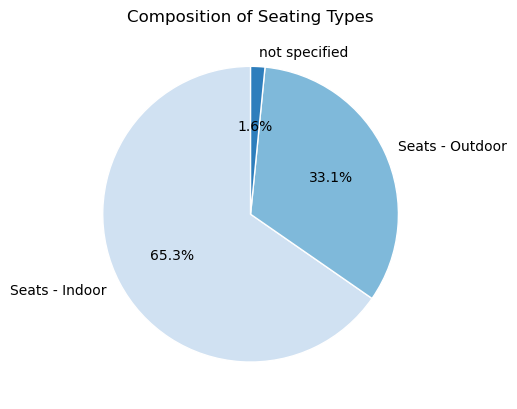

In [56]:
##Composition of Seating Types
seating_counts = cafes_and_bars_df['seating_type'].value_counts()


labels = seating_counts.index
sizes = seating_counts.values
colors = plt.get_cmap('Blues')(np.linspace(0.2, 0.7, len(labels)))

fig, ax = plt.subplots()
ax.pie(sizes, colors=colors, labels=labels, autopct='%1.1f%%', startangle=90,
       wedgeprops={"linewidth": 1, "edgecolor": "white"})

ax.set(aspect='equal') 

plt.title('Composition of Seating Types')
plt.show()

In [57]:
#Sum the Total seats (Indoor + Outdoor)
total_seats = cafes_and_bars_df.groupby('longitude')['number_of_seats'].sum().reset_index()

# Rename the column 
total_seats.rename(columns={'number_of_seats': 'total_number_of_seats'}, inplace=True)

# Merge the total seats into the original DataFrame
cafes_and_bars_df = cafes_and_bars_df.drop(columns=['number_of_seats']).merge(total_seats, on='longitude')

print(cafes_and_bars_df.head())

cafes_and_bars_df.shape

  clue_small_area   industry_description     seating_type   longitude  \
0       Docklands  Cafes and Restaurants   Seats - Indoor  144.936589   
1       Docklands  Cafes and Restaurants  Seats - Outdoor  144.936589   
2       Docklands  Cafes and Restaurants  Seats - Outdoor  144.936589   
3       Docklands  Cafes and Restaurants  Seats - Outdoor  144.936589   
4       Docklands  Cafes and Restaurants   Seats - Indoor  144.936589   

    latitude  total_number_of_seats  
0 -37.811859                    484  
1 -37.811859                    484  
2 -37.811859                    484  
3 -37.811859                    484  
4 -37.811859                    484  


(3079, 6)

In [58]:
###Drop the Seating Type Column
cafes_and_bars_df = cafes_and_bars_df.drop(columns=['seating_type'])

In [59]:
###Remove Duplicates
cafes_and_bars_df.drop_duplicates(keep='first', inplace=True)
cafes_and_bars_df.duplicated().sum()

0

In [60]:
cafes_and_bars_df.shape

(1455, 5)

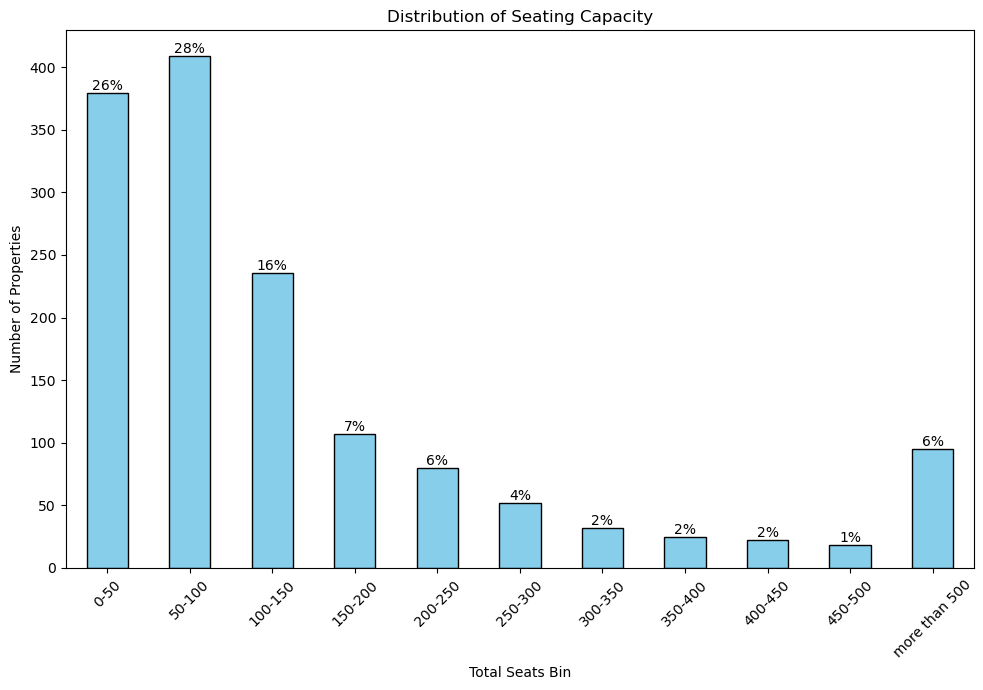

In [109]:
###Plot the Distribution of Seating Capacity

pivot_df = cafes_and_bars_df.copy()  
cafes_and_bars_df['total_number_of_seats'] = pivot_df['total_number_of_seats']  

# Create bins for total number of seats
bins = list(range(0, 501, 50)) + [float('inf')]
labels = [f'{i}-{i+50}' for i in range(0, 500, 50)] + ['more than 500']
pivot_df['seats_bin'] = pd.cut(pivot_df['total_number_of_seats'], bins=bins, labels=labels, right=False)

bin_counts = pivot_df['seats_bin'].value_counts().sort_index()

# Calculate percentages
total_properties = bin_counts.sum()
percentages = (bin_counts / total_properties * 100).round(1)

plt.figure(figsize=(10, 7))
ax = bin_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of Seating Capacity')
plt.xlabel('Total Seats Bin')
plt.ylabel('Number of Properties')
plt.xticks(rotation=45)
plt.tight_layout()

for p in ax.patches:
    height = p.get_height()
    bin_label = p.get_x() + p.get_width() / 2
    bin_label_name = ax.get_xticklabels()[int(bin_label)].get_text()
    percentage = percentages[bin_label_name]
    ax.text(p.get_x() + p.get_width() / 2, height, f'{percentage:.0f}%', 
            ha='center', va='bottom', fontsize=10)

plt.show()

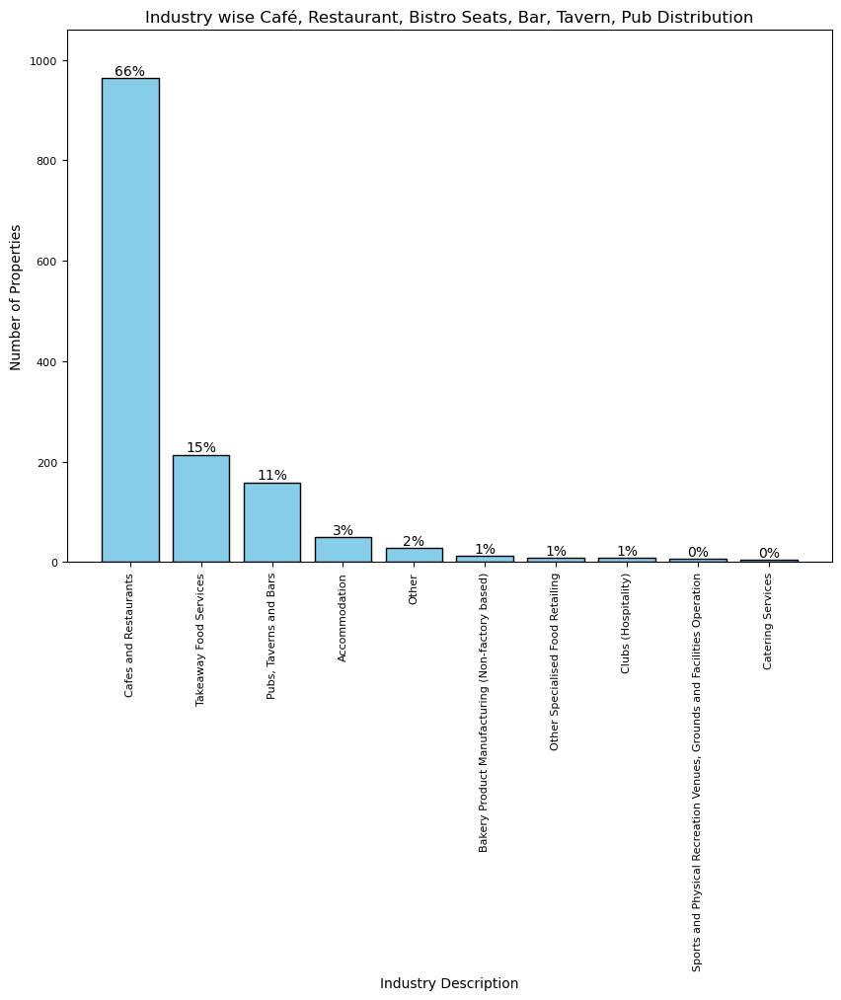

In [111]:
###Plot the Distribution of Industies 

industry_counts = cafes_and_bars_df['industry_description'].value_counts()

# Calculate percentages
total_count = industry_counts.sum()
percentages = (industry_counts / total_count) * 100

fig, ax = plt.subplots(figsize=(10, 7))
bar_container = ax.bar(industry_counts.index, industry_counts, color='skyblue',edgecolor='black')


ax.set_xlabel('Industry Description', fontsize=10)
ax.set_ylabel('Number of Properties', fontsize=10)
ax.set_title('Industry wise Café, Restaurant, Bistro Seats, Bar, Tavern, Pub Distribution', fontsize=12)
ax.set_ylim(0, max(industry_counts) + max(industry_counts) * 0.1)  
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)

for p in ax.patches:
    height = p.get_height()
    bin_label = p.get_x() + p.get_width() / 2
    bin_label_name = ax.get_xticklabels()[int(bin_label)].get_text()
    percentage = percentages[bin_label_name]
    ax.text(p.get_x() + p.get_width() / 2, height, f'{percentage:.0f}%', 
            ha='center', va='bottom', fontsize=10)


plt.show()

C:\Users\chath\AppData\Local\Temp\ipykernel_30196\480536194.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = pivot_df.groupby(['seats_bin', 'industry_description']).size().unstack(fill_value=0)


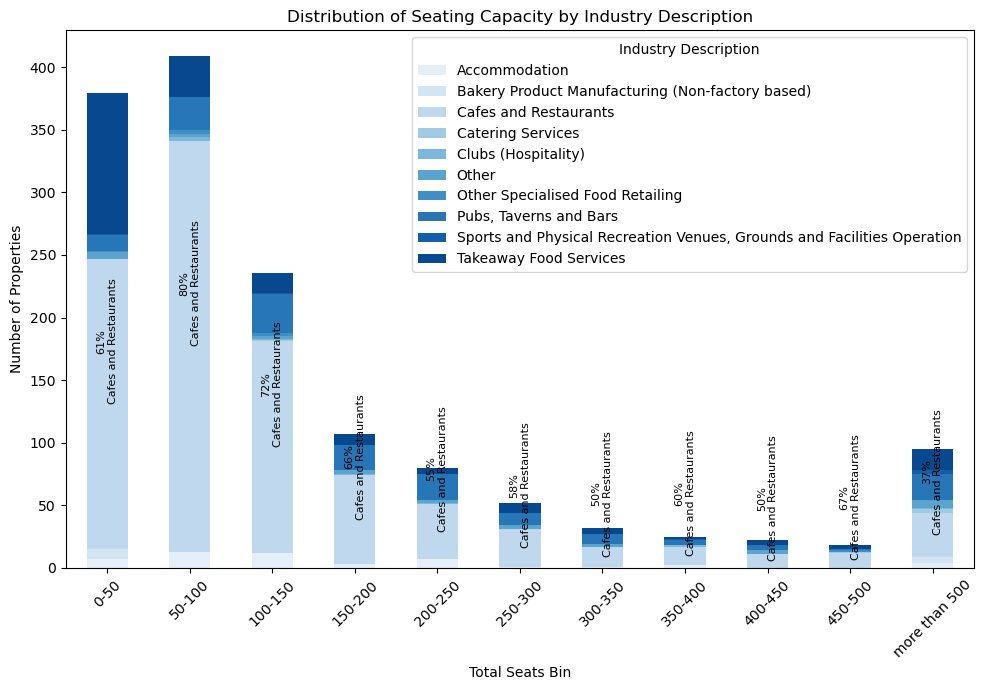

In [99]:
###Plot Industry wise seating Capacity

# Group by seats_bin and industry_description, and count the occurrences
grouped = pivot_df.groupby(['seats_bin', 'industry_description']).size().unstack(fill_value=0)

# Calculate the percentage contribution of each industry description within each seats_bin
percentages = grouped.divide(grouped.sum(axis=1), axis=0) * 100


ax = grouped.plot(kind='bar', stacked=True, figsize=(10, 7), color=(sns.color_palette("Blues", n_colors=10)))

for i, bin in enumerate(grouped.index):
    max_contrib_idx = percentages.loc[bin].idxmax()
    max_contrib_val = percentages.loc[bin].max()
    ax.annotate(f'{max_contrib_val:.0f}%\n{max_contrib_idx}', 
                xy=(i, grouped.loc[bin, :].cumsum()[max_contrib_idx] - grouped.loc[bin, max_contrib_idx]/2), 
                ha='center', va='bottom', fontsize=8, color='black', rotation = 90)

plt.title('Distribution of Seating Capacity by Industry Description')
plt.xlabel('Total Seats Bin')
plt.ylabel('Number of Properties')
plt.xticks(rotation=45)
plt.legend(title='Industry Description')
plt.tight_layout()

plt.show()

In [117]:
###Displaying the Cafes and Bar locations on map using Folium

map = folium.Map(location=[cafes_and_bars_df['latitude'].mean(), cafes_and_bars_df['longitude'].mean()], zoom_start=10)

# Add markers for each location
for index, row in cafes_and_bars_df.iterrows():

    folium.Marker([row['latitude'], row['longitude']], popup=row['industry_description'],icon=folium.Icon("blue"),icon_size=(2, 2)).add_to(map)

    
legend_html = """
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 200px; height:50px; 
            border:2px  grey; font-size:12px;
            background-color:white;">
</div>
"""
    
# Add legend HTML to the map
map.get_root().html.add_child(folium.Element(legend_html))
    
title_html = """
<h3 style="text-align: center; margin: 10px 0;">Café, Restaurant, Bistro Seats, Bar, Tavern, Pub Locations</h3>
"""
map.get_root().html.add_child(folium.Element(title_html))



display(map)

#### Parking Bays.



In [13]:
parkingbays_df.head()

,roadsegmentid,kerbsideid,roadsegmentdescription,latitude,longitude,lastupdated
0,22730,NaN,Park Street between Mason Street and Randall P...,-37.836245,144.982021,2022-08-31
1,22730,NaN,Park Street between Mason Street and Randall P...,-37.835800,144.982115,2022-08-31
2,20013,5701,Lonsdale Street between William Street and Kin...,-37.814238,144.955451,2023-10-02
3,20013,23444,Lonsdale Street between William Street and Kin...,-37.814271,144.955334,2023-10-02
4,22268,NaN,Clowes Street between Anderson Street and Wals...,-37.830568,144.984713,2022-08-31


In [14]:
parkingbays_df.shape

(19162, 6)

In [16]:
# Convert the 'lastupdated' column to datetime
parkingbays_df['lastupdated'] = pd.to_datetime(parkingbays_df['lastupdated'])

###Filtering Latest Data
parkingbays_df = parkingbays_df[parkingbays_df['lastupdated'].dt.year == 2023 ]

In [17]:
# Drop  columns
parkingbays_df = parkingbays_df.drop(columns=['roadsegmentid','kerbsideid', 'lastupdated'])

# Rename roadsegmentdescription column as location
parkingbays_df = parkingbays_df.rename(columns={'roadsegmentdescription': 'location'})

#Added Parking Type column
parkingbays_df['parking_type'] = 'Parking Bay'

In [18]:
parkingbays_df.nunique()

location         522
latitude        7625
longitude       7616
parking_type       1
dtype: int64

In [19]:
parkingbays_df.drop_duplicates(keep='first', inplace=True)
parkingbays_df.duplicated().sum()

0

#### Parking Meters.



In [20]:
parkingmeters_df.head()

,barcode,creditcard,tapandgo,longitude,latitude,location,asset_id,meter_id,location_description
0,MPM1629535,Yes,Yes,144.950892,-37.781481,"-37.7814806, 144.9508916",1629535,ZOOT4,"Royal Park, approximately 82m SW of Royal Park..."
1,MPM1629544,Yes,Yes,144.954400,-37.783399,"-37.7833993, 144.9543996",1629544,ZOOT10,Royal Park
2,MPM1629545,Yes,Yes,144.951384,-37.787068,"-37.7870681, 144.9513842",1629545,ZOOT22A,Royal Park
3,MPM1629560,Yes,Yes,144.954217,-37.784939,"-37.7849386, 144.9542174",1629560,ZOOT17,"Royal Park, approximately 91m East of House 1 ..."
4,MPM1629563,Yes,Yes,144.953962,-37.783012,"-37.7830122, 144.9539618",1629563,ZOOT7,"Royal Park, approximately 93m NE of Lakeside B..."


In [21]:
parkingmeters_df.shape

(1260, 9)

In [22]:
# Drop  columns
parkingmeters_df = parkingmeters_df.drop(columns=['barcode','creditcard', 'tapandgo','location','asset_id', 'meter_id'])

# Rename Location_description'
parkingmeters_df = parkingmeters_df.rename(columns={'location_description': 'location'})

#Added parking Type column
parkingmeters_df['parking_type'] = 'Parking Meter'

In [23]:
parkingmeters_df.nunique()

longitude       1259
latitude        1259
location        1198
parking_type       1
dtype: int64

In [24]:
###Remove duplicates
parkingmeters_df.drop_duplicates(keep='first', inplace=True)
parkingmeters_df.duplicated().sum()

0

#### Create Total Parking Data Set.



In [25]:
parking_df = pd.concat([parkingmeters_df, parkingbays_df], ignore_index=True)

In [26]:
parking_df.head()

,longitude,latitude,location,parking_type
0,144.950892,-37.781481,"Royal Park, approximately 82m SW of Royal Park...",Parking Meter
1,144.954400,-37.783399,Royal Park,Parking Meter
2,144.951384,-37.787068,Royal Park,Parking Meter
3,144.954217,-37.784939,"Royal Park, approximately 91m East of House 1 ...",Parking Meter
4,144.953962,-37.783012,"Royal Park, approximately 93m NE of Lakeside B...",Parking Meter


In [29]:
parking_df.nunique()

longitude       8842
latitude        8864
location        1716
parking_type       2
dtype: int64

In [30]:
##Check Null Values
parking_df.isna().sum() ##No any Null Values

longitude       0
latitude        0
location        0
parking_type    0
dtype: int64

#### Data Visualization- Total Parking Data Set.



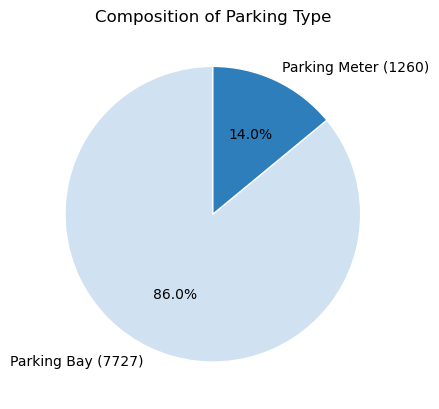

In [31]:

parking_counts = parking_df['parking_type'].value_counts()


labels = [f'{label} ({count})' for label, count in zip(parking_counts.index, parking_counts.values)]
sizes = parking_counts.values
colors = plt.get_cmap('Blues')(np.linspace(0.2, 0.7, len(labels)))

fig, ax = plt.subplots()
ax.pie(sizes, colors=colors, labels=labels, autopct='%1.1f%%', startangle=90,
       wedgeprops={"linewidth": 1, "edgecolor": "white"})

ax.set(aspect='equal') 

plt.title('Composition of Parking Type')
plt.show()

In [32]:
###Displaying Parking Bays and Meters locations on map using Folium

map = folium.Map(location=[parking_df['latitude'].mean(), parking_df['longitude'].mean()], zoom_start=10)

# Add markers for each location
for index, row in parking_df.iterrows():

    folium.Marker([row['latitude'], row['longitude']], popup=row['location'],icon=folium.Icon("blue"),icon_size=(2, 2)).add_to(map)

    
legend_html = """
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 200px; height:50px; 
            border:2px  grey; font-size:12px;
            background-color:white;">
</div>
"""
    
# Add legend HTML to the map
map.get_root().html.add_child(folium.Element(legend_html))
    
title_html = """
<h3 style="text-align: center; margin: 10px 0;">Parking Locations</h3>
"""
map.get_root().html.add_child(folium.Element(title_html))



display(map)

### References

